<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Base/AI_HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 26 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

`Фиксирование seed необходимо для повторяемости результатов. Другой человек, который захочет воспроизвести то, что получилось у нас, должен увидеть тот же самый результат.`

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [3]:
# Отобразите 10 случайных строк тренировочного датасета (0.15 балла)

df_train.sample(n=10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [4]:
# Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)

df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [5]:
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [6]:
# Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)

df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [7]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


`Да, наблюдаем пропуски в колонках mileage, engine, max_power, torque, seats`

In [8]:
# Посмотрите, есть ли в данных явные дубликаты (0.05 балла)

df_train[df_train.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
326,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6880,Renault Captur 1.5 Diesel RXT,2018,1265000,12000,Diesel,Individual,Manual,First Owner,20.37 kmpl,1461 CC,108.45 bhp,240Nm@ 1750rpm,5.0
6881,Maruti Ciaz Alpha Diesel,2019,1025000,32000,Diesel,Individual,Manual,First Owner,28.09 kmpl,1248 CC,88.50 bhp,200Nm@ 1750rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [9]:
df_test[df_test.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
200,Maruti Swift AMT VVT VXI,2019,650000,5621,Petrol,Trustmark Dealer,Automatic,First Owner,22.0 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
235,Hyundai Grand i10 1.2 CRDi Sportz,2017,450000,56290,Diesel,Dealer,Manual,First Owner,24.0 kmpl,1186 CC,73.97 bhp,190.24nm@ 1750-2250rpm,5.0
238,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
253,Tata Safari Storme EX,2015,503000,110000,Diesel,Individual,Manual,First Owner,14.1 kmpl,2179 CC,147.94 bhp,320Nm@ 1500-3000rpm,7.0
269,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
934,Mercedes-Benz S-Class S 350 CDI,2017,6000000,37000,Diesel,Dealer,Automatic,First Owner,13.5 kmpl,2987 CC,254.79 bhp,620Nm@ 1600-2400rpm,5.0
936,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
949,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
971,Maruti Ertiga SHVS ZDI Plus,2017,750000,50000,Diesel,Individual,Manual,First Owner,24.52 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,7.0


`Да, в данных есть явные дубликаты`

In [10]:
# Постройте дашборд

!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q

     / 17.9 MB 34.9 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 52.3 MB/s eta 0:00:00


In [11]:
from ydata_profiling import ProfileReport

In [12]:
df_train_copy = df_train.copy()

profile_report_train = ProfileReport(df_train_copy, title='Pandas Profiling Report')

In [13]:
profile_report_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
profile_report_train.to_file('train_part_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
df_test_copy = df_test.copy()

profile_report_test = ProfileReport(df_test_copy, title='Pandas Profiling Report')

In [16]:
profile_report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
profile_report_test.to_file('test_part_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
from google.colab import files

files.download('train_part_report.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
files.download('test_part_report.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [20]:
df_train.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [21]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


In [22]:
# посмотрим на mileage

df_train[['mileage']].iloc[:10]

,mileage
0,23.4 kmpl
1,21.14 kmpl
2,23.0 kmpl
3,16.1 kmpl
4,20.14 kmpl
5,17.3 km/kg
6,16.1 kmpl
7,23.59 kmpl
8,20.0 kmpl
9,19.01 kmpl


In [23]:
# удалим единицы измерения

df_train['mileage'] = df_train['mileage'].str.split(' ').str[0]
df_test['mileage'] = df_test['mileage'].str.split(' ').str[0]

df_train['mileage'] = df_train['mileage'].astype(float)
df_test['mileage'] = df_test['mileage'].astype(float)

In [24]:
# посмотрим на engine

df_train[['engine']].iloc[:10]

,engine
0,1248 CC
1,1498 CC
2,1396 CC
3,1298 CC
4,1197 CC
5,1061 CC
6,796 CC
7,1364 CC
8,1399 CC
9,1461 CC


In [25]:
# удалим единицы измерения, заменим null на 0 в предыдущем пункте, чтобы конвертировать колонку в int, а потом заменить нули обратно на NaN

df_train['engine'] = df_train['engine'].str.split(' ').str[0].fillna(0)
df_test['engine'] = df_test['engine'].str.split(' ').str[0].fillna(0)

In [28]:
df_train['engine'] = df_train['engine'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)

In [29]:
df_train['engine'] = df_train['engine'].replace(0, np.nan)
df_test['engine'] = df_test['engine'].replace(0, np.nan)

In [30]:
# посмотрим на max_power

df_train[['max_power']].iloc[:10]

,max_power
0,74 bhp
1,103.52 bhp
2,90 bhp
3,88.2 bhp
4,81.86 bhp
5,57.5 bhp
6,37 bhp
7,67.1 bhp
8,68.1 bhp
9,108.45 bhp


In [31]:
# удалим единицы измерения

df_train['max_power'] = df_train['max_power'].str.split(' ').str[0].replace('', np.nan).fillna(0)
df_test['max_power'] = df_test['max_power'].str.split(' ').str[0].replace('', np.nan).fillna(0)

df_train['max_power'] = df_train['max_power'].astype(float)
df_test['max_power'] = df_test['max_power'].astype(float)

df_train['max_power'] = df_train['max_power'].replace(0, np.nan)
df_test['max_power'] = df_test['max_power'].replace(0, np.nan)

In [32]:
# посмотрим на torque

df_train[['torque']].iloc[:10]

,torque
0,190Nm@ 2000rpm
1,250Nm@ 1500-2500rpm
2,22.4 kgm at 1750-2750rpm
3,"11.5@ 4,500(kgm@ rpm)"
4,113.75nm@ 4000rpm
5,"7.8@ 4,500(kgm@ rpm)"
6,59Nm@ 2500rpm
7,170Nm@ 1800-2400rpm
8,160Nm@ 2000rpm
9,248Nm@ 2250rpm


In [33]:
# удалим столбец torque

df_train = df_train.drop(columns=['torque'])
df_test = df_test.drop(columns=['torque'])

In [34]:
# посмотрим на seats

df_train[['seats']].iloc[:10]

,seats
0,5.0
1,5.0
2,5.0
3,5.0
4,5.0
5,5.0
6,4.0
7,5.0
8,5.0
9,5.0


In [35]:
df_train['seats'] = df_train['seats'].fillna(0).astype(int)
df_test['seats'] = df_test['seats'].fillna(0).astype(int)

df_train['seats'] = df_train['seats'].replace(0, np.nan)
df_test['seats'] = df_test['seats'].replace(0, np.nan)

In [36]:
columns = ['mileage', 'engine', 'max_power', 'seats']

In [37]:
medians_dict = dict()

In [38]:
for col in columns:
    df_train[col].fillna(df_train[col].median(), inplace=True)
    df_test[col].fillna(df_train[col].median(), inplace=True)

    medians_dict[col] = df_train[col].median()

<ipython-input-38-23eea22e7926>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train[col].fillna(df_train[col].median(), inplace=True)
<ipython-input-38-23eea22e7926>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)'

In [39]:
medians_dict

{'mileage': 19.3, 'engine': 1248.0, 'max_power': 82.0, 'seats': 5.0}

In [40]:
df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


In [41]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [42]:
df_train_wo_target = df_train.drop(columns=['selling_price'])

In [43]:
# да, в трейне есть объекты с одинаковым признаковым описанием - 1159 объектов

df_train_wo_target[df_train_wo_target.duplicated()]

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
254,Hyundai Grand i10 Sportz,2017,35000,Petrol,Individual,Manual,First Owner,18.90,1197.0,82.00,5.0
258,Maruti Swift VXI,2012,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,85.80,5.0
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,19.10,1197.0,85.80,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,9000,Diesel,Dealer,Automatic,First Owner,13.60,1999.0,177.00,5.0
325,Lexus ES 300h,2019,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487.0,214.56,5.0
...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,60000,Petrol,Individual,Manual,Second Owner,18.00,995.0,62.00,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,24000,Diesel,Individual,Manual,First Owner,24.40,1498.0,98.63,5.0
6989,Maruti Swift Dzire VDI,2015,50000,Diesel,Individual,Manual,First Owner,26.59,1248.0,74.00,5.0
6997,Tata Indigo CR4,2013,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,5.0


In [44]:
# удалим полные дубли по всем колонкам

df_train = df_train.drop_duplicates()

In [45]:
# удалим дубли по одинаковым признаковым описаниям и оставим только первый вариант цены

df_train = df_train.drop_duplicates(subset=['name', 'year', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage', 'engine', 'max_power', 'seats'], keep='first')

In [46]:
assert df_train.shape == (5840, 12)

In [47]:
df_train = df_train.reset_index(drop=True)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [ ]:
# сделано в задании №1 при заполнении пропусков медианами

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [ ]:
# сделано в задании №1 при заполнении пропусков медианами

### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [48]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.428611,1429.448973,87.952905,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.986026,485.662834,31.577030,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,32.800000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.300000,1248.000000,82.000000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [49]:
df_train.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [50]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.337480,1454.87600,90.844330,5.403000
std,4.012149,7.585539e+05,48486.218662,3.951751,521.99574,34.892709,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.550000,1197.00000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.300000,1248.00000,82.425000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.300000,1582.00000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.00000,280.000000,9.000000


In [51]:
df_test.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [52]:
assert df_train.shape == (5840, 12)

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

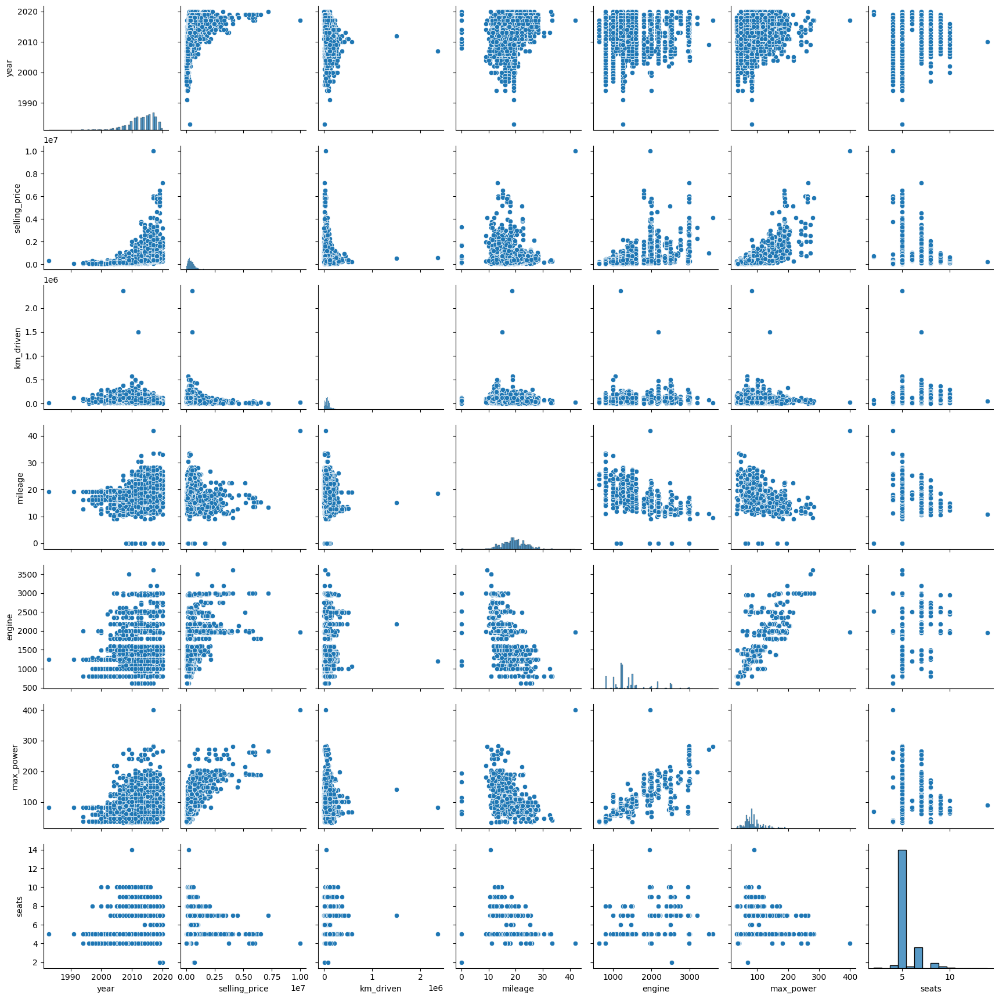

In [53]:
sns.pairplot(df_train)

<b>1) Можно ли предположить на основе распределений связь признаков с целевой переменной?</b> <br>
Возможно, max_power и engine связаны c ценой по принципу: чем больше одно, тем больше другое <br>
<b>2) Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?</b> <br>
Можно предположить по графикам, что есть положительная корреляция между признаками engine и max_power

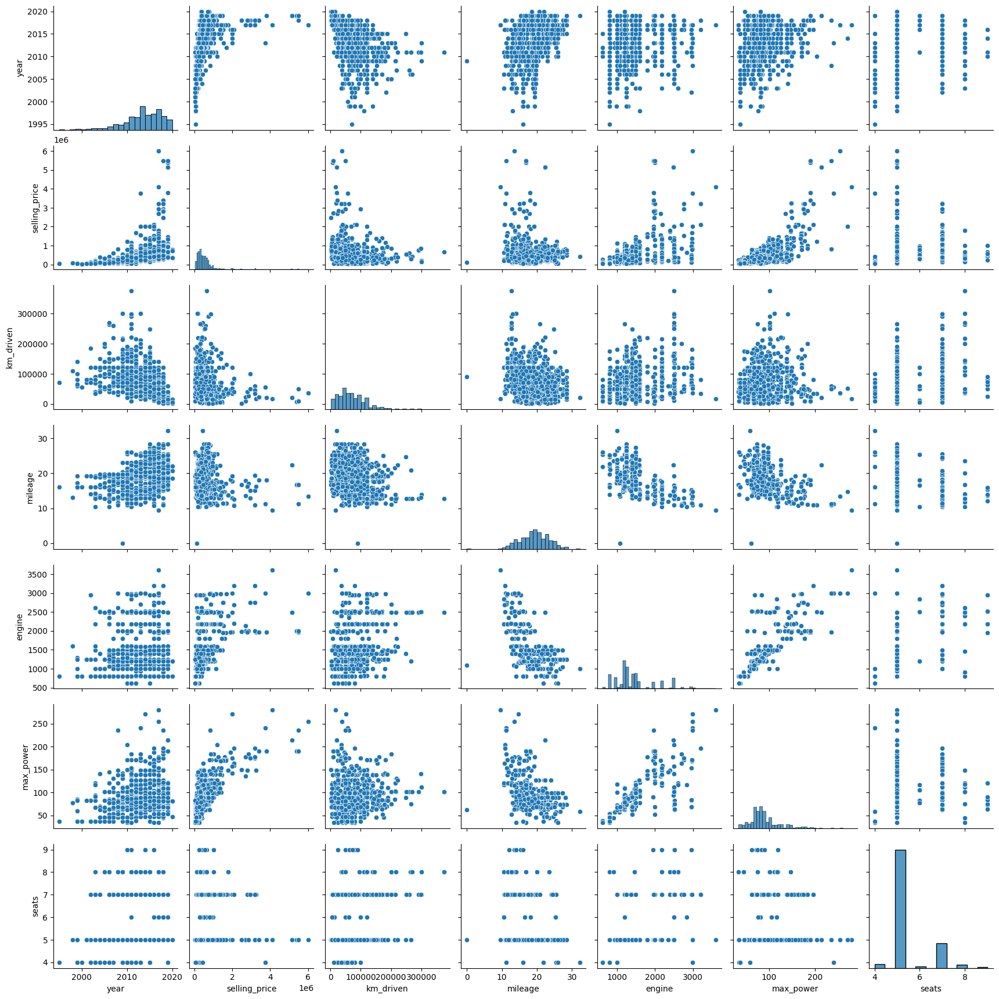

In [54]:
sns.pairplot(df_test)

`Да, совокупности при разделении на трейн и тест оказались похожими`

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [55]:
corr_matrix = df_train.select_dtypes(include=['number']).corr()

corr_matrix

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.000000,0.427279,-0.368966,0.342172,0.002819,0.156927,0.041178
selling_price,0.427279,1.000000,-0.164828,-0.104458,0.447672,0.693682,0.149953
km_driven,-0.368966,-0.164828,1.000000,-0.182245,0.229766,0.024581,0.192328
mileage,0.342172,-0.104458,-0.182245,1.000000,-0.572677,-0.374054,-0.450810
engine,0.002819,0.447672,0.229766,-0.572677,1.000000,0.681933,0.652172
max_power,0.156927,0.693682,0.024581,-0.374054,0.681933,1.000000,0.243964
seats,0.041178,0.149953,0.192328,-0.450810,0.652172,0.243964,1.000000


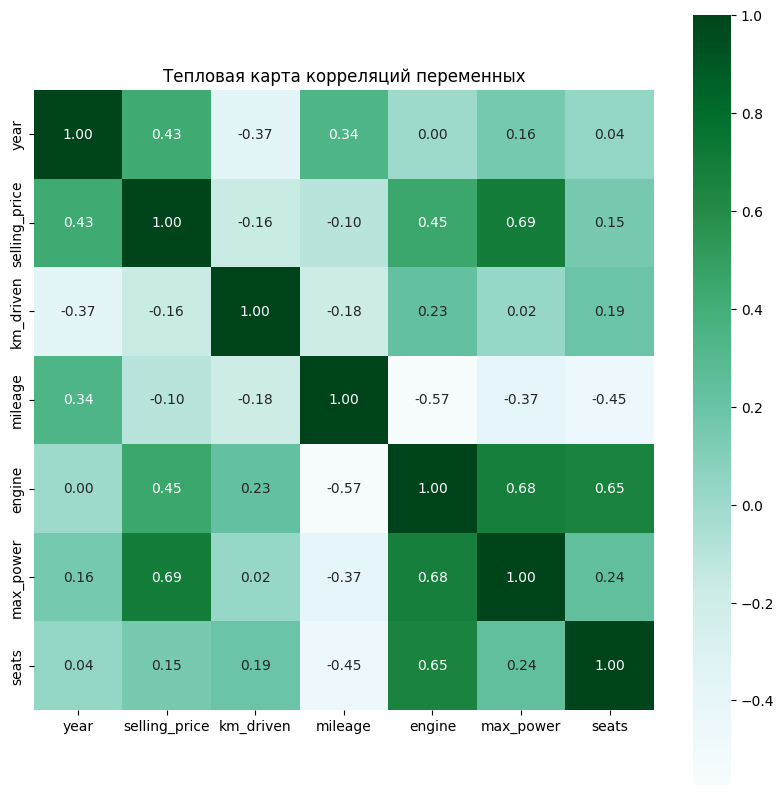

In [56]:
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='BuGn', square=True, cbar=True)
plt.title('Тепловая карта корреляций переменных')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

1) Наименее скоррелированы между собой engine и year <br>
2) Довольно сильная положительная линейная зависимость наблюдается у max_power и selling_price, max_power и engine, seats и engine <br>
3) Такое может наблюдаться, но корреляция не очень сильная

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

<ipython-input-57-cfd9bdeded74>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='fuel', data=df_train, palette='viridis')


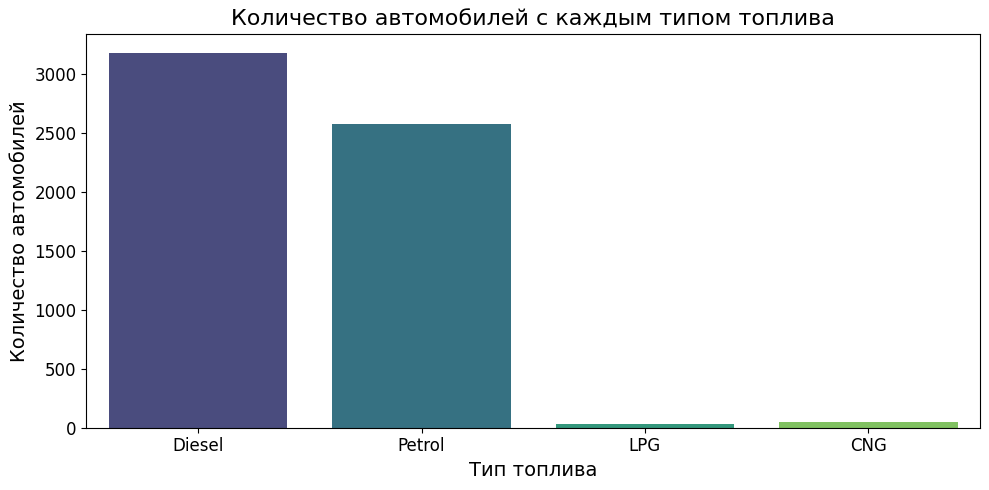

In [57]:
plt.figure(figsize=(10, 5))
sns.countplot(x='fuel', data=df_train, palette='viridis')

plt.title('Количество автомобилей с каждым типом топлива', fontsize=16)
plt.xlabel('Тип топлива', fontsize=14)
plt.ylabel('Количество автомобилей', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

В трейн-датасете значительно преобладают виды топлива diesel (более 3000 штук) и petrol (примерно 2500)

<ipython-input-58-78079f7529a1>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='owner', data=df_train, palette='viridis')


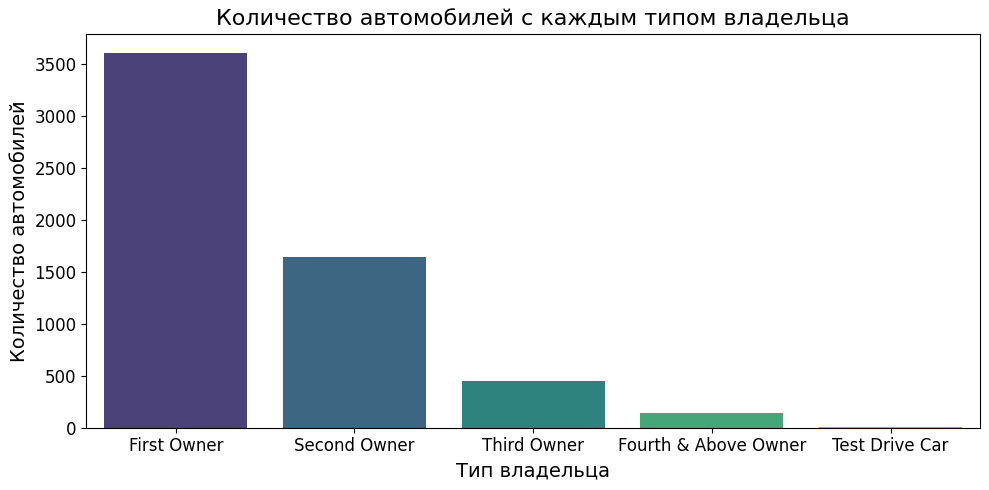

In [58]:
plt.figure(figsize=(10, 5))
sns.countplot(x='owner', data=df_train, palette='viridis')

plt.title('Количество автомобилей с каждым типом владельца', fontsize=16)
plt.xlabel('Тип владельца', fontsize=14)
plt.ylabel('Количество автомобилей', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

Больше всего машин выставлено на продажу их первым владельцем (более 3500 штук), совсем мало автомобилей с тест-драйва (менее 100)

<ipython-input-59-c8142ce64603>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='seller_type', data=df_train, palette='viridis')


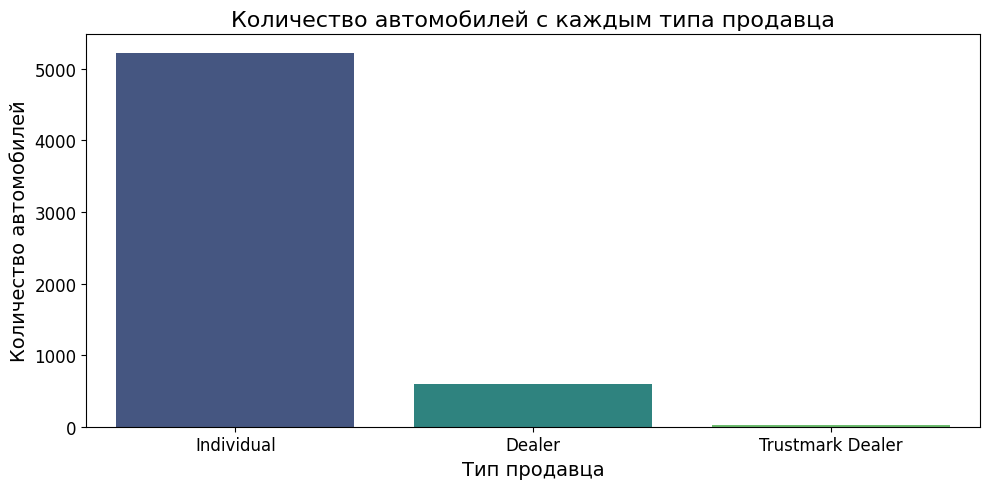

In [59]:
plt.figure(figsize=(10, 5))
sns.countplot(x='seller_type', data=df_train, palette='viridis')

plt.title('Количество автомобилей с каждым типа продавца', fontsize=16)
plt.xlabel('Тип продавца', fontsize=14)
plt.ylabel('Количество автомобилей', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

Более 5000 авто выставлено на продажу индивидуальными владельцами, их большинство. Менее 100 - продаются trustmark dealer продавцами.

<ipython-input-60-b5018a9e3856>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='transmission', data=df_train, palette='viridis')


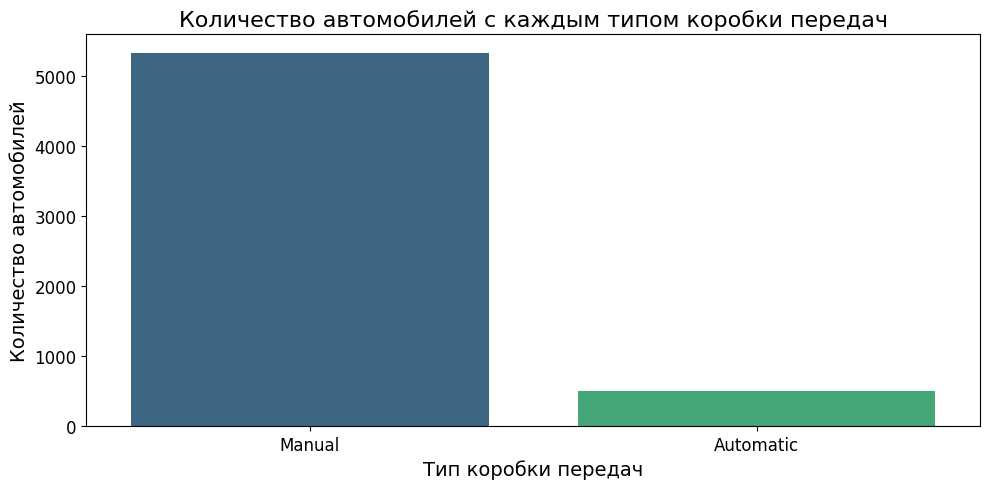

In [60]:
plt.figure(figsize=(10, 5))
sns.countplot(x='transmission', data=df_train, palette='viridis')

plt.title('Количество автомобилей с каждым типом коробки передач', fontsize=16)
plt.xlabel('Тип коробки передач', fontsize=14)
plt.ylabel('Количество автомобилей', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

В трейновом датасете заметно преобладают автомобили с ручной коробкой передач (более 5000 шт) и примерно 500 штук - с автоматической коробкой передач.

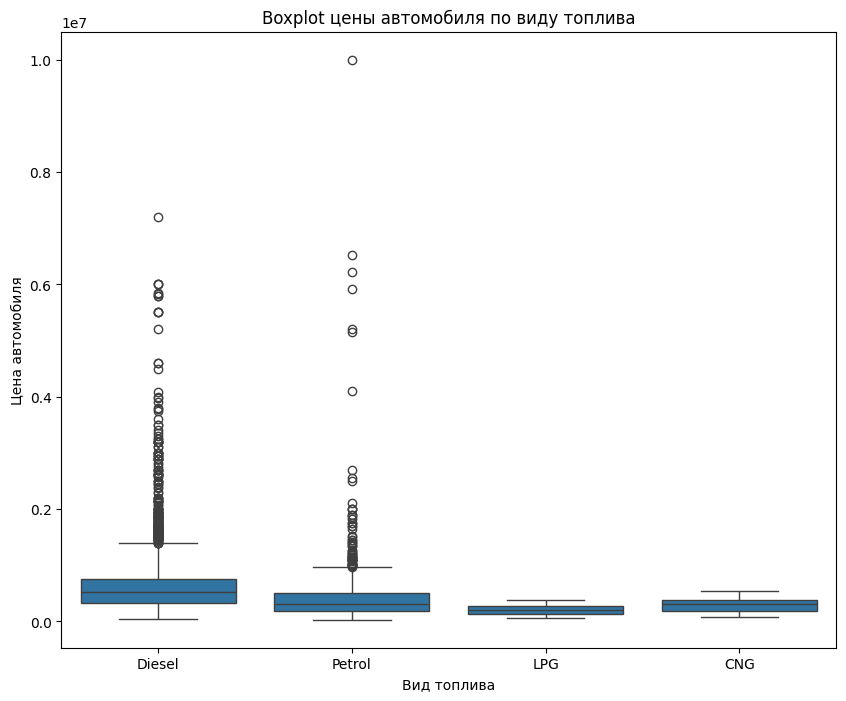

In [61]:
plt.figure(figsize=(10, 8))

sns.boxplot(x='fuel', y='selling_price', data=df_train)

plt.xlabel('Вид топлива')
plt.ylabel('Цена автомобиля')
plt.title('Boxplot цены автомобиля по виду топлива')
plt.show()

В среднем автомобили с дизельным топливом стоят дороже

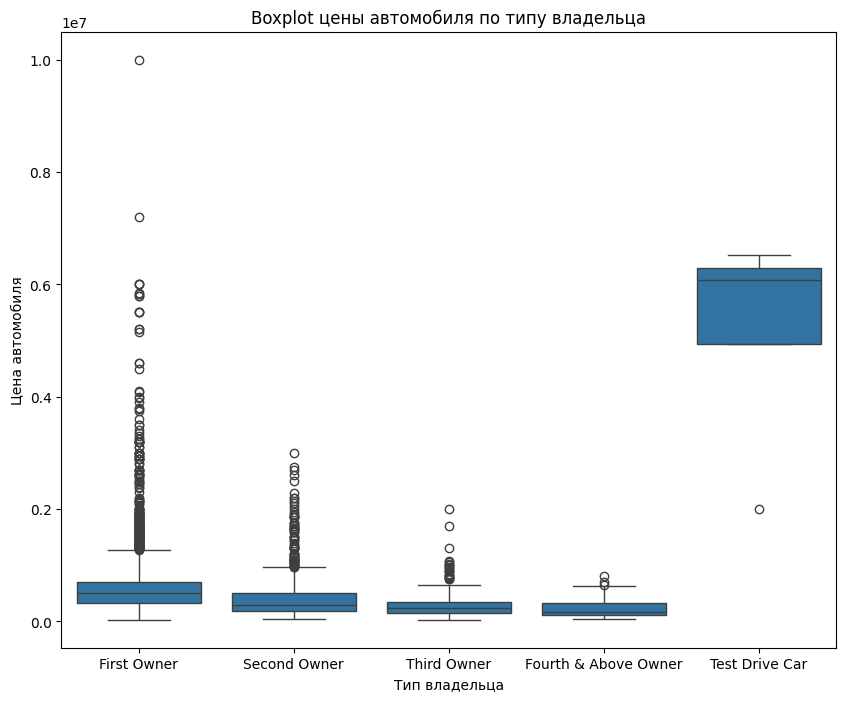

In [62]:
plt.figure(figsize=(10, 8))

sns.boxplot(x='owner', y='selling_price', data=df_train)

plt.xlabel('Тип владельца')
plt.ylabel('Цена автомобиля')
plt.title('Boxplot цены автомобиля по типу владельца')
plt.show()

Видим заметное отличие в цене для авто с тест-драйва - они гораздо дороже <br>
Также видим, что, чем больше было владельцев у машины, тем она скорее всего будет дешевле

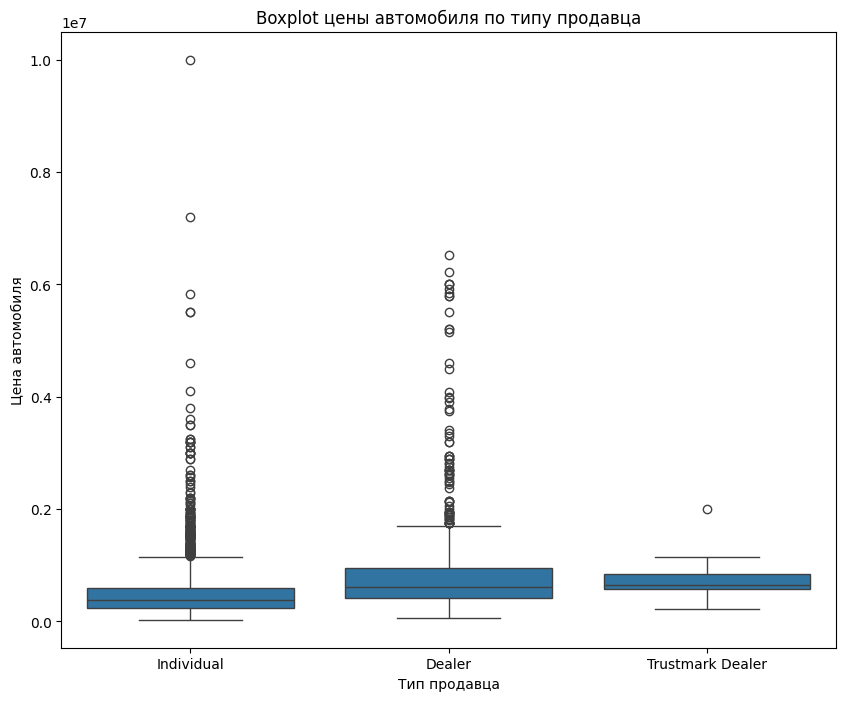

In [63]:
plt.figure(figsize=(10, 8))

sns.boxplot(x='seller_type', y='selling_price', data=df_train)

plt.xlabel('Тип продавца')
plt.ylabel('Цена автомобиля')
plt.title('Boxplot цены автомобиля по типу продавца')
plt.show()

Для trustmark dealer продавцов наблюдаем, что всего-лишь один автомобиль вышел по цене за пределы верхней границы боксплота в отличие от individual и dealer. Как мы видели на барчарте, машин с таким типом продавца в целом очень мало. <br>
Самая дорогая машина продается индивидуальным продавцом.

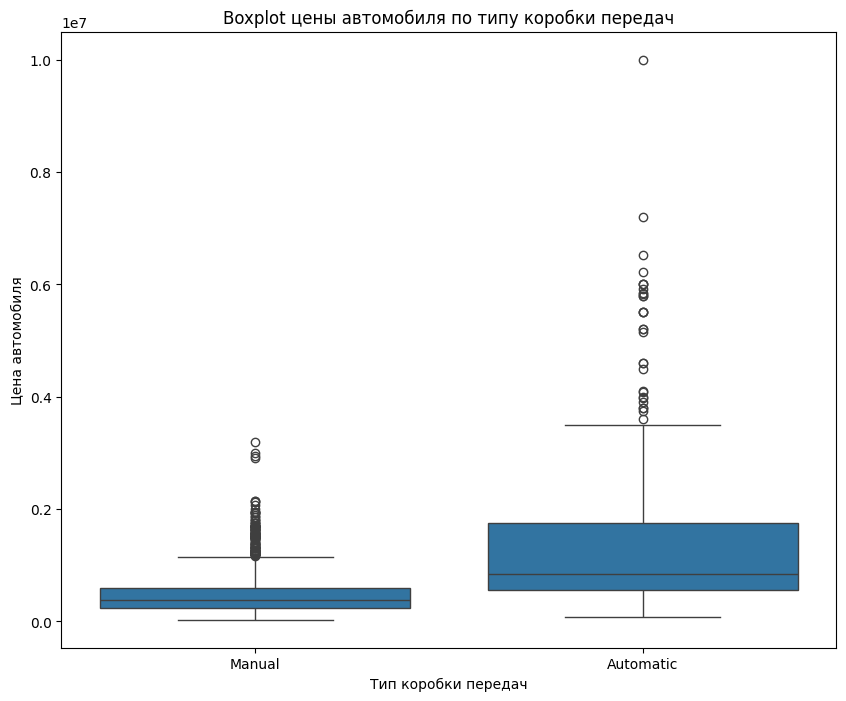

In [64]:
plt.figure(figsize=(10, 8))

sns.boxplot(x='transmission', y='selling_price', data=df_train)

plt.xlabel('Тип коробки передач')
plt.ylabel('Цена автомобиля')
plt.title('Boxplot цены автомобиля по типу коробки передач')
plt.show()

Машины с автоматической коробкой передач в среднем стоят дороже, чем с ручной, и самые дорогие автомобили также имеют автоматическую коробку передач.

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [65]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0


In [66]:
y_df_train = df_train[['selling_price']]
X_df_train = df_train.drop(columns=['selling_price'])

In [67]:
# разобьем трейн на тренировочные и валидационные данные
from sklearn.model_selection import train_test_split

X_train_all, X_val_all, y_train_all, y_val_all = train_test_split(
    X_df_train, y_df_train,
    test_size=0.2,
    random_state=42
)

In [68]:
X_train = X_train_all.drop(X_train_all.select_dtypes(include=['object', 'category']).columns, axis=1)
y_train = y_train_all.drop(y_train_all.select_dtypes(include=['object', 'category']).columns, axis=1)

X_val = X_val_all.drop(X_val_all.select_dtypes(include=['object', 'category']).columns, axis=1)
y_val = y_val_all.drop(y_val_all.select_dtypes(include=['object', 'category']).columns, axis=1)

In [69]:
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(4672, 6) (4672, 1)
(1168, 6) (1168, 1)


In [70]:
df_test_wo_cat = df_test.drop(df_test.select_dtypes(include=['object', 'category']).columns, axis=1)

In [71]:
y_test = df_test_wo_cat[['selling_price']]
X_test = df_test_wo_cat.drop(columns=['selling_price'])

In [72]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [73]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model = LinearRegression()

model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)

print(f'''---------Metrics---------
Train:
mse={MSE(y_train, y_train_pred)}
R2={r2_score(y_train, y_train_pred)}

Val:
mse={MSE(y_val, y_val_pred)}
R2={r2_score(y_val, y_val_pred)}

Test:
mse={MSE(y_test, y_test_pred)}
R2={r2_score(y_test, y_test_pred)}
''')

---------Metrics---------
Train:
mse=107670968282.59169
R2=0.5980565064388832

Val:
mse=158057866401.31277
R2=0.562912609878647

Test:
mse=236269427066.3744
R2=0.5889740954084002



MSE и R2 хуже всего для теста <br>
MSE: ухудшается в порядке train --> val --> test <br>
R2: ухудшается в порядке train --> test --> val

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [74]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

train_x_scaler = scaler.transform(X_train)
train_x_scaler = pd.DataFrame(data=train_x_scaler)

val_x_scaler = scaler.transform(X_val)
val_x_scaler = pd.DataFrame(data=val_x_scaler)

test_x_scaler = scaler.transform(X_test)
test_x_scaler = pd.DataFrame(data=test_x_scaler)

In [75]:
# сохраним scaler

import pickle
from google.colab import files

filename = "scaler.pkl"

with open(filename, "wb") as file:
    pickle.dump(scaler, file)

files.download("scaler.pkl")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [76]:
lr = LinearRegression()
lr.fit(train_x_scaler, y_train)

y_test_pred_lr = lr.predict(test_x_scaler)
y_val_pred_lr = lr.predict(val_x_scaler)
y_train_pred_lr = lr.predict(train_x_scaler)

print(f'''---------Metrics---------
Train:
mse={MSE(y_train, y_train_pred_lr)}
R2={r2_score(y_train, y_train_pred_lr)}

Val:
mse={MSE(y_val, y_val_pred_lr)}
R2={r2_score(y_val, y_val_pred_lr)}

Test:
mse={MSE(y_test, y_test_pred_lr)}
R2={r2_score(y_test, y_test_pred_lr)}
''')

---------Metrics---------
Train:
mse=107670968282.59183
R2=0.5980565064388828

Val:
mse=158057866401.33075
R2=0.5629126098785973

Test:
mse=236269427066.36218
R2=0.5889740954084214



Получили подтверждения, что для "голой" линейной регрессии стандартизация не дает изменений в ответе.

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [77]:
coefficients = lr.coef_.flatten()
feature_names = X_train.columns

dict(zip(feature_names, coefficients))

{'year': 150555.8168293382,
 'km_driven': -60095.91679963432,
 'mileage': 19614.021574880244,
 'engine': 83406.03200258859,
 'max_power': 292208.65785738884,
 'seats': -28278.35846490605}

Наиболее информативным в предсказании цены оказался признак max_power

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [78]:
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(train_x_scaler, y_train)

y_pred_train_lasso = lasso.predict(train_x_scaler)
y_pred_val_lasso = lasso.predict(val_x_scaler)
y_pred_test_lasso = lasso.predict(test_x_scaler)

print(f'''
---------Metrics---------
Train:
mse={MSE(y_train, y_pred_train_lasso)}
R2={r2_score(y_train, y_pred_train_lasso)}

Val:
mse={MSE(y_val, y_pred_val_lasso)}
R2={r2_score(y_val, y_pred_val_lasso)}

Test:
mse={MSE(y_test, y_pred_test_lasso)}
R2={r2_score(y_test, y_pred_test_lasso)}
-------------------------
''')


---------Metrics---------
Train:
mse=107670968293.08104
R2=0.5980565063997256

Val:
mse=158057562329.5361
R2=0.5629134507475155

Test:
mse=236270135186.09442
R2=0.5889728635285412
-------------------------



При использовании Lasso регрессии метрики практически не изменились.

In [79]:
coefficients = lasso.coef_.flatten()
feature_names = X_train.columns

dict(zip(feature_names, coefficients))

{'year': 150555.87997667232,
 'km_driven': -60094.550563920086,
 'mileage': 19611.987930907235,
 'engine': 83400.93650336665,
 'max_power': 292209.58834889205,
 'seats': -28275.510948887626}

L1-регуляризация с параметрами по умолчанию не занулила веса. Если веса изначально были маленькие, то у них есть шанс занулиться, а у нас веса довольно большие.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [80]:
from sklearn.model_selection import GridSearchCV

params = {'alpha' : [0.01, 0.1, 0.5, 1, 10, 50, 100, 500, 1000, 1500, 2000, 2500, 3000]}

lasso_w_grid = Lasso(max_iter=1000)

gs = GridSearchCV(lasso_w_grid, params, cv=10, scoring='r2')
gs.fit(train_x_scaler, y_train)

GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [0.01, 0.1, 0.5, 1, 10, 50, 100, 500, 1000,
                                   1500, 2000, 2500, 3000]},
             scoring='r2')

In [81]:
print('Столько моделей пришлось обучать грид-сёрчу:', len(gs.cv_results_['mean_fit_time']) * 10)

Столько моделей пришлось обучать грид-сёрчу: 130


In [82]:
# у лучшей из перебранных моделей коэффициент регуляризации = 1500

gs.best_score_, gs.best_estimator_, gs.best_params_

(0.5992168089437897, Lasso(alpha=1500), {'alpha': 1500})

In [83]:
coefficients = gs.best_estimator_.coef_.flatten()
feature_names = X_train.columns

dict(zip(feature_names, coefficients))

{'year': 150545.3470533491,
 'km_driven': -58113.915098320205,
 'mileage': 16698.568081900623,
 'engine': 75923.4530907003,
 'max_power': 293574.009696282,
 'seats': -24023.885081113523}

Нет, веса не занулились

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [84]:
from sklearn.linear_model import ElasticNet

params = {'alpha' : [0.001, 0.01, 0.05, 0.1, 0.5, 1, 10, 50, 100, 500, 1000, 1500, 2000, 2500, 3000],
          'l1_ratio' : np.arange(0.0, 1.0, 0.1)}

elast_w_grid = ElasticNet(max_iter=1000)

gs_2 = GridSearchCV(elast_w_grid, params, cv=10, scoring='r2')
gs_2.fit(train_x_scaler, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.235e+14, tolerance: 1.097e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.236e+14, tolerance: 1.089e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_mode

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [0.001, 0.01, 0.05, 0.1, 0.5, 1, 10, 50, 100,
                                   500, 1000, 1500, 2000, 2500, 3000],
                         'l1_ratio': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])},
             scoring='r2')

In [85]:
print('Столько моделей пришлось обучать грид-сёрчу:', len(gs_2.cv_results_['mean_fit_time']) * 10)

Столько моделей пришлось обучать грид-сёрчу: 1500


In [86]:
# у лучшей из перебранных моделей альфа = 0.1 и l1_ratio = 0.7

gs_2.best_score_, gs_2.best_estimator_, gs_2.best_params_

(0.5994706366870176,
 ElasticNet(alpha=0.1, l1_ratio=0.7000000000000001),
 {'alpha': 0.1, 'l1_ratio': 0.7000000000000001})

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [87]:
X_train_cat = X_train_all[['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']]

X_train_cat

,name,fuel,seller_type,transmission,owner,seats
5309,Hyundai Grand i10 CRDi Asta,Diesel,Individual,Manual,Second Owner,5.0
1647,Maruti Swift VDI BSIV W ABS,Diesel,Individual,Manual,First Owner,5.0
1669,Maruti Swift VDI,Diesel,Individual,Manual,Second Owner,5.0
3159,Ford Fiesta 1.5 TDCi Titanium,Diesel,Individual,Manual,First Owner,5.0
4575,Hyundai Grand i10 1.2 Kappa Magna BSIV,Petrol,Individual,Manual,First Owner,5.0
...,...,...,...,...,...,...
3772,Maruti Eeco CNG HTR 5-STR,CNG,Individual,Manual,First Owner,5.0
5191,Maruti Wagon R LXI CNG,CNG,Individual,Manual,First Owner,5.0
5226,Hyundai Santro Xing XO,Petrol,Individual,Manual,First Owner,5.0
5390,Renault Triber RXZ BSIV,Petrol,Individual,Manual,First Owner,7.0


In [88]:
X_train_cat = X_train_cat.drop(columns=['name'])

In [89]:
X_test_cat = df_test[['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']]
X_test_cat = X_test_cat.drop(columns=['name'])

X_test_cat

,fuel,seller_type,transmission,owner,seats
0,Diesel,Individual,Manual,First Owner,7.0
1,Diesel,Individual,Manual,First Owner,5.0
2,Petrol,Individual,Automatic,First Owner,5.0
3,Diesel,Individual,Manual,First Owner,5.0
4,Petrol,Individual,Manual,Second Owner,5.0
...,...,...,...,...,...
995,Petrol,Individual,Manual,Second Owner,5.0
996,Petrol,Individual,Manual,Second Owner,5.0
997,Diesel,Individual,Manual,First Owner,5.0
998,Petrol,Individual,Manual,First Owner,5.0


В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [ ]:
assert X_train_cat.shape == (5840, 10)

AssertionError: 

In [ ]:
X_train_cat.describe(include='object')

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [90]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore', drop='first')
encoder.fit(X_train_cat)

X_dum = encoder.transform(X_train_cat)
X_dum_test = encoder.transform(X_test_cat)

In [91]:
X_dum_dense = X_dum.toarray()
X_dum_df = pd.DataFrame(X_dum_dense, columns=encoder.get_feature_names_out(X_train_cat.columns))
X_dum_df.index = X_train_cat.index

In [92]:
X_dum_df = X_dum_df.reset_index(drop=True)

In [93]:
X_dum_dense_test = X_dum_test.toarray()
X_dum_test_df = pd.DataFrame(X_dum_dense_test, columns=encoder.get_feature_names_out(X_test_cat.columns))
X_dum_test_df.index = X_test_cat.index

In [94]:
X_dum_test_df = X_dum_test_df.reset_index(drop=True)

In [95]:
# сохраним encoder

import pickle
from google.colab import files

filename = "encoder.pkl"

with open(filename, "wb") as file:
    pickle.dump(encoder, file)

files.download("encoder.pkl")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [96]:
# добавим закодированные категории к вещественным признакам

train_x_scaler_dum = pd.concat([train_x_scaler, X_dum_df], axis=1)
test_x_scaler_dum = pd.concat([test_x_scaler, X_dum_test_df], axis=1)

In [97]:
# для избежания ошибки TypeError: Feature names are only supported if all input features have string names

train_x_scaler_dum.columns = train_x_scaler_dum.columns.astype(str)
test_x_scaler_dum.columns = test_x_scaler_dum.columns.astype(str)

In [98]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

params = {'alpha' : [0.01, 0.1, 0.5, 1, 10, 50, 100, 500, 1000, 1500, 2000, 2500, 3000]}

ridge_w_grid = Ridge(max_iter=1000)

gs_3 = GridSearchCV(ridge_w_grid, params, cv=10, scoring='r2')
gs_3.fit(train_x_scaler_dum, y_train)

GridSearchCV(cv=10, estimator=Ridge(max_iter=1000),
             param_grid={'alpha': [0.01, 0.1, 0.5, 1, 10, 50, 100, 500, 1000,
                                   1500, 2000, 2500, 3000]},
             scoring='r2')

In [99]:
# альфа = 0.01

gs_3.best_score_, gs_3.best_estimator_, gs_3.best_params_

(0.6843565720065383, Ridge(alpha=0.01, max_iter=1000), {'alpha': 0.01})

0.5992 --> 0.5995 --> 0.6844 <br>
По сравнению с предыдущими метриками качество модели по R2 улучшилось ~ на 0.09

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [100]:
def business_metric(y_true, y_pred):
    result = pd.concat([y_true, y_pred], axis=1)
    result['diff_percent'] = abs(result.iloc[:, 0] - result.iloc[:, 1]) * 100 / result.iloc[:, 0]
    result['is_good'] = result['diff_percent'].apply(lambda x: 1 if x <= 10 else 0)
    metric = sum(result['is_good']) * 100 / len(result)
    return metric

In [101]:
# model, lr, lasso, gs.best_estimator_ (lasso), gs_2.best_estimator_ (elasticnet), gs_3.best_estimator_ (ridge)
y_test_pred = pd.DataFrame(y_test_pred)
y_test_pred_lr = pd.DataFrame(y_test_pred_lr)
y_pred_test_lasso = pd.DataFrame(y_pred_test_lasso)
gs_y_pred_test = pd.DataFrame(gs.best_estimator_.predict(test_x_scaler))
gs_2_y_pred_test = pd.DataFrame(gs_2.best_estimator_.predict(test_x_scaler))
gs_3_y_pred_test = pd.DataFrame(gs_3.best_estimator_.predict(test_x_scaler_dum))

y_true = y_test
print('Метрика 1:', business_metric(y_true, y_test_pred))
print('Метрика 2:', business_metric(y_true, y_test_pred_lr))
print('Метрика 3:', business_metric(y_true, y_pred_test_lasso))
print('Метрика 4:', business_metric(y_true, gs_y_pred_test))
print('Метрика 5:', business_metric(y_true, gs_2_y_pred_test))
print('Метрика 6:', business_metric(y_true, gs_3_y_pred_test))

Метрика 1: 21.7
Метрика 2: 21.7
Метрика 3: 21.7
Метрика 4: 21.7
Метрика 5: 23.2
Метрика 6: 23.6


Наилучший результат в конктексте бизнес-метрики получила гребневая регрессия, она же дала наилучший результат по офлайн-метрике.
Она же дала лучший результат по бизнес-метрике, на 0.4% от неё отстает ElasticNet. <br>
В целом, результат пока ещё далек от идеального, так как все модели успешно для бизнеса угадали цену в 21-23% случаев.

In [102]:
# сохраним наилучшую модель

import pickle

best_model = gs_3.best_estimator_

filename = "best_model.pkl"

with open(filename, "wb") as file:
    pickle.dump(best_model, file)

In [103]:
with open("best_model.pkl", "rb") as file:
    loaded_model = pickle.load(file)

print(loaded_model)

Ridge(alpha=0.01, max_iter=1000)


In [104]:
from google.colab import files

files.download("best_model.pkl")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [107]:
#!python3 -m pip install "fastapi[all]"

In [109]:
#!npm install localtunnel

In [113]:
%%writefile main.py

from fastapi import FastAPI, UploadFile, HTTPException
from pydantic import BaseModel
from typing import List
import pandas as pd
import pickle
import joblib
import os
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Инициализация FastAPI
app = FastAPI()

# Загрузка модели из pickle-файла
if not os.path.exists('best_model.pkl'):
    raise FileNotFoundError("Файл модели 'model.pkl' не найден. Убедитесь, что он находится в текущем каталоге.")
model = joblib.load('best_model.pkl')

medians = {'mileage': 19.3, 'engine': 1248.0, 'max_power': 82.0, 'seats': 5.0}

# Модели данных
class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    """
    Обрабатывает словарь, выполняет предобработку данных и возвращает предсказание модели.
    """
    data = pd.DataFrame([item.dict()])
    prepared_data = preprocess_data(data)
    return float(model.predict(prepared_data)[0])


@app.post("/predict_items")
def predict_items(file: UploadFile):
    """
    Обрабатывает CSV-файл, выполняет предобработку данных и возвращает предсказания модели.
    """
    data = pd.read_csv(file.file)

    required_columns = Item.schema()["properties"].keys()
    if not set(required_columns).issubset(data.columns):
        raise HTTPException(status_code=400, detail="Некорректный формат данных в файле.")

    prepared_data = preprocess_data(data)

    predictions = model.predict(prepared_data)

    data['predicted_price'] = predictions

    return data.to_dict(orient='records')


def preprocess_data(data: pd.DataFrame) -> pd.DataFrame:
    """
    Функция для подготовки данных перед предсказанием.
    Масштабированеи вещественных данных, one-hot encoding категориальных признаков.
    """
    # переводим вещественные данные из строки в число
    data['mileage'] = data['mileage'].str.split(' ').str[0]
    data['mileage'] = data['mileage'].astype(float)

    data['engine'] = data['engine'].str.split(' ').str[0]
    data['engine'] = data['engine'].astype(int)

    data['max_power'] = data['max_power'].str.split(' ').str[0]
    data['max_power'] = data['max_power'].astype(float)

    data = data.drop(columns=['torque', 'selling_price'])

    data['seats'] = data['seats'].astype(int)

    if len(data) == 1:
        # выделяем только вещественные данные
        df_wo_cat = data.drop(data.select_dtypes(include=['object', 'category']).columns, axis=1)

        # заполняем пропуски медианой
        for key in medians:
            df_wo_cat[key].fillna(medians[key], inplace=True)

        df_wo_cat.columns = [0, 1, 2, 3, 4, 5]

        df_cat = data[['fuel', 'seller_type', 'transmission', 'owner', 'seats']] # без name

        # загружаем encoder из pickle-файла
        if not os.path.exists('encoder.pkl'):
            raise FileNotFoundError("Файл 'encoder.pkl' не найден. Убедитесь, что он находится в текущем каталоге.")
        encoder = joblib.load('encoder.pkl')

        X_dum = encoder.transform(df_cat)

        X_dum_dense = X_dum.toarray()
        X_dum_df = pd.DataFrame(X_dum_dense, columns=encoder.get_feature_names_out(df_cat.columns))
        X_dum_df.index = df_cat.index

        X = pd.concat([df_wo_cat, X_dum_df], axis=1)
    else:
        # выделяем только вещественные данные
        df_wo_cat = data.drop(data.select_dtypes(include=['object', 'category']).columns, axis=1)

        # заполняем пропуски медианой
        for key in medians:
            df_wo_cat[key].fillna(medians[key], inplace=True)

        # загружаем scaler из pickle-файла
        if not os.path.exists('scaler.pkl'):
            raise FileNotFoundError("Файл 'scaler.pkl' не найден. Убедитесь, что он находится в текущем каталоге.")
        scaler = joblib.load('scaler.pkl')

        X_scal = scaler.transform(df_wo_cat)
        X_scal = pd.DataFrame(data=X_scal)

        df_cat = data[['fuel', 'seller_type', 'transmission', 'owner', 'seats']] # без name

        # загружаем encoder из pickle-файла
        if not os.path.exists('encoder.pkl'):
            raise FileNotFoundError("Файл 'encoder.pkl' не найден. Убедитесь, что он находится в текущем каталоге.")
        encoder = joblib.load('encoder.pkl')

        X_dum = encoder.transform(df_cat)

        X_dum_dense = X_dum.toarray()
        X_dum_df = pd.DataFrame(X_dum_dense, columns=encoder.get_feature_names_out(df_cat.columns))
        X_dum_df.index = df_cat.index

        X = pd.concat([X_scal, X_dum_df], axis=1)

    # для предупреждения ошибки приводим наименования колонок к строковому типу
    X.columns = X.columns.astype(str)

    return X

Overwriting main.py


In [116]:
#!uvicorn main:app & npx localtunnel --port 8000 --subdomain fastapi & wget -q -O - https://loca.lt/mytunnelpassword

In [115]:
from google.colab import files

files.download("main.py")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже). <br>
**Скриншоты в .md файле.**

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>



Ответ: Первый кот принадлежит **Елене**.